In [14]:
import numpy as np
import torch
from sbi import utils as utils
from sbi.inference.base import infer
import matplotlib.pyplot as plt
from data_read import read_obs, read_indiv_obs
from analysis_utils import violin_plots, welch_ttest,glassdelta_effect_size, mse, marked_dist_plot
import sklearn
import scipy.io
from scipy.stats import ttest_ind
import pickle
import copy
import pandas as pd
import seaborn as sns
from sbi import analysis as analysis
import pandas as pd
import configparser
from model import Model

train = False

In [35]:
all_labels = ['Aud Delay',
          'Somat Delay',
          'Log_10 Aud Noise Var',
          'Noise Ratio (Aud:Somat)',
          'Controller Gain']

def simulator_no_noise(parameter_set):
    config = configparser.ConfigParser()
    config.read('pitch_pert_configs.ini')
    override_params(config,parameter_set)
    model = Model(config)
    y_output,errors = model.run()
    pitch_output = y_output[:,0,0]
    pitch_output[pitch_output < 50] = 50
    pitch_baseline = np.mean(pitch_output[0:50])
    pitch_output_cents = 1200 * np.log2(pitch_output/pitch_baseline)
    return pitch_output_cents

def override_params(config,parameter_set):
    config['Observer']['aud_fdbk_delay'] = str(parameter_set[0].item())
    config['Observer']['somat_fdbk_delay'] = str(parameter_set[1].item())
    config['Vocal_Tract']['aud_noise_covariance'] = str(10**parameter_set[2].item())
    config['Vocal_Tract']['somat_noise_covariance'] = str(10**parameter_set[2].item() / parameter_set[3].item())
    config['Controller']['controller_gain'] = str(parameter_set[4].item())

def simulator(parameter_set):
    training_noise_scale = 7
    pitch_output_cents = simulator_no_noise(parameter_set)
    pitch_output_cents_wnoise = pitch_output_cents + ((np.random.rand(len(pitch_output_cents)) - 0.5) * training_noise_scale)
    return pitch_output_cents_wnoise

def compare(posterior, obs_list, n_samples,prior_min,prior_max,labels,fwer=0.05,fit_stde=False,name=None,xlabel=False):
    data_list=[]
    for observation in obs_list:
        np.random.seed(10)
        torch.manual_seed(10)
        samples = posterior.sample((n_samples,), x=observation.get('data'))
        log_probability = posterior.log_prob(samples, x=observation.get('data'))
        max_likelihood = samples[torch.argmax(log_probability)]
        print(max_likelihood)
        topk_likelihood = samples[torch.topk(log_probability,1000).indices]
        marked_dist_plot(samples, prior_min, prior_max, labels, max_likelihood=max_likelihood, actual_params=None, name=observation.get('name'))
        data = {'name': observation.get('name'),'color': observation.get('color'),'taxis':observation.get('taxis'),'samples':samples, 
                'max_likelihood': max_likelihood, 'topk_likelihood': topk_likelihood}
        data_list.append(data)
    sig_list = welch_ttest(data_list,fwer,len(labels))
    glass_delta_list = glassdelta_effect_size(data_list,len(labels),n_samples)
    plot_actual_data(obs_list)
    inferred_list = plot_actual_inferred_data(obs_list,data_list,name=name,xlabel=xlabel,ylabel=True,ylim=None)
    diff_list = np.ndarray((2,))
    diff_list[0] = mse(obs_list[0].get('data'),inferred_list[0,:])
    diff_list[1] = mse(obs_list[1].get('data'),inferred_list[1,:])
    print("MSE: " + str(diff_list))
    violin_plots(data_list,sig_list,glass_delta_list,prior_min,prior_max,labels,name)
    return data_list, diff_list
    
def plot_actual_data(obs_list,ax=None,xlabel=False,ylabel=False,ylim=[-5,45],legend=False,show_pert=False):
    if ax is None:
        fig, ax = plt.subplots()
    if show_pert:
        ax.axvspan(0,0.4,alpha=0.2,color='gray')
        ax.annotate('Perturbation',(0.01,40),fontsize=12,color='gray')
    for i, obs in enumerate(obs_list):
        ax.plot(obs.get('taxis'),obs.get('data'),label=obs.get('name'),linewidth=5,linestyle=':',color=obs.get('color'),alpha=0.5)
        ax.plot(obs.get('taxis'),obs.get('data')+obs.get('stde'),linewidth=2,linestyle=':',color=obs.get('color'))
        ax.plot(obs.get('taxis'),obs.get('data')-obs.get('stde'),linewidth=2,linestyle=':',color=obs.get('color'))
        #plt.fill_between(obs.get('taxis'),
        #             obs.get('data')+obs.get('stde'),
        #             obs.get('data')-obs.get('stde'),
        #             linewidth=5,color='#A3A3A3')
        if xlabel:
            ax.set_xlabel('Time (s)',fontsize=15)
            ax.tick_params(axis='x',which='major',labelsize=14)
        else: ax.set_xticks([])
        if ylabel:
            ax.set_ylabel('Pitch (cents)',fontsize=15)
            ax.tick_params(axis='y',which='major',labelsize=14)
        else: ax.set_yticks([])
        if ylim is not None:
            ax.set_ylim(ylim)
        if legend:
            ax.annotate(obs.get('name'), (0.7, 40-4*i), fontsize=15, color=obs.get('color'))
                     
def plot_actual_inferred_data(obs_list,data_list,ax=None,name=None,xlabel=False,ylabel=False,ylim=[-5,45],obs_to_plot=None,color=None,legend=True):
    ntrials = 1000
    inferred_list = np.ndarray((len(obs_list),len(obs_list[0].get('data'))))
    #plt.figure(figsize=(5,4))
    if ax is None:
        fig, ax = plt.subplots()
    if len(obs_list) < 5:
        plot_actual_data(obs_list,ax,xlabel,ylabel,ylim)
        for i, data in enumerate(data_list):
            #topk_likelihood = data.get('topk_likelihood')
            #ntrials = topk_likelihood.shape[0]
            if color is None: plot_color = data.get('color')
            else: plot_color = color
            taxis = obs_list[0].get('taxis')
            inferred_all = np.ndarray((ntrials,len(taxis)))
            for j in range(ntrials):
                #params = topk_likelihood[j,:]
                inferred_all[j,:] = simulator_no_noise(data.get('max_likelihood'))
                #inferred_all[j,:] = simulator_no_noise(params)
            inferred = np.median(inferred_all,axis=0)
            stde = np.std(inferred_all,axis=0) / np.sqrt(ntrials)
            inferred_list[i,:] = inferred
            if obs_to_plot is None or i in obs_to_plot:
                ax.plot(taxis,inferred,label=data.get('name')+' inferred',linewidth=5,color=plot_color)
                ax.plot(taxis,inferred-stde, linewidth=2,color=plot_color)
                ax.plot(taxis,inferred+stde, linewidth=2, color=plot_color)
    else: 
        for x in range(len(obs_list)):
            plot_actual_inferred_data([obs_list[x]],[data_list[x]],name=name,xlabel=xlabel)
    return inferred_list

def run_sbi(filename,nreps,prior_min_all,prior_max_all,all_labels,train=True,ablate=None):
    mse_sub = np.ndarray([2,nreps])
    labels = copy.deepcopy(all_labels)
    prior_min = copy.deepcopy(prior_min_all)
    prior_max = copy.deepcopy(prior_max_all)
    if ablate is not None:
        labels.pop(ablate)
        prior_min.pop(ablate)
        prior_max.pop(ablate)
    inferred_control_values_all = np.ndarray([len(labels),2,n_reps])
    for seed in range(nreps):
        if train:
            prior = utils.torchutils.BoxUniform(low=torch.as_tensor(prior_min), high=torch.as_tensor(prior_max))
            np.random.seed(seed)
            torch.manual_seed(seed)
            posterior = infer(simulator,prior, method='SNPE', num_simulations=n_simulations)
            posterior_save = {'prior_min':prior_min,'prior_max':prior_max,'posterior':posterior,'seed':seed}
            with open('posterior/'+ filename + '_seed' + str(seed) + '.pkl', "wb") as handle:
                pickle.dump(posterior_save,handle)
        np.random.seed(seed)
        torch.manual_seed(seed)
        with open('posterior/'+ filename + '_seed' + str(seed) + '.pkl', 'rb') as handle:
            posterior_dict = pickle.load(handle)
        posterior_new = posterior_dict.get('posterior')
        prior_min = posterior_dict.get('prior_min')
        prior_max = posterior_dict.get('prior_max')
        data_list,mse_sub[:,seed] = compare(posterior_new,list(observation_dict.get('CA').values()),n_samples,prior_min,prior_max,labels,fit_stde=False,name='CA',xlabel=True)
        inferred_control_values_all[:,0,seed] = data_list[0].get('max_likelihood')
        inferred_control_values_all[:,1,seed] = data_list[1].get('max_likelihood')
    return data_list,inferred_control_values_all,mse_sub    

In [16]:
observation_dict = {}
    
observation_dict['CA'] = {'Controls': read_obs('pitch_pert_data/CA_Data/','CA','jh','control',"#E3787B"), 
                          'Patients': read_obs('pitch_pert_data/CA_Data/','CA','jh','patient',"#FFD166")}

C:\Users\jgaines\Anaconda3\envs\pitch_model_env\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


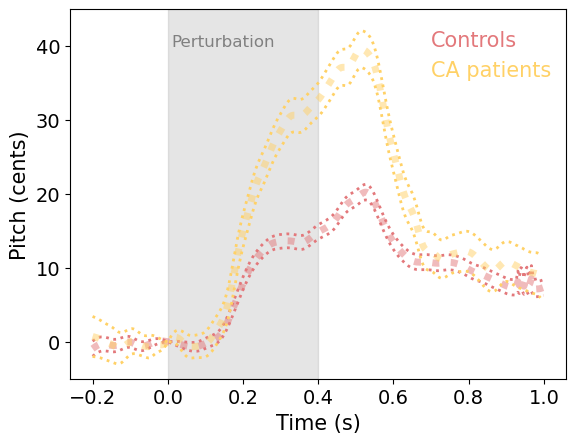

In [17]:
### If this plot does not show the data from Houde et al. 2019, run the previous cell again
plot_actual_data(observation_dict.get('CA').values(),xlabel='Time (s)',ylabel='Pitch (cents)',legend=True,show_pert=True)

In [18]:
n_simulations = 100000
n_samples = 10000
n_reps = 10
mse_vals = np.ndarray([3,2,n_reps])

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([115.4177,  24.5819,  -8.8205,   1.8496,   1.8289])


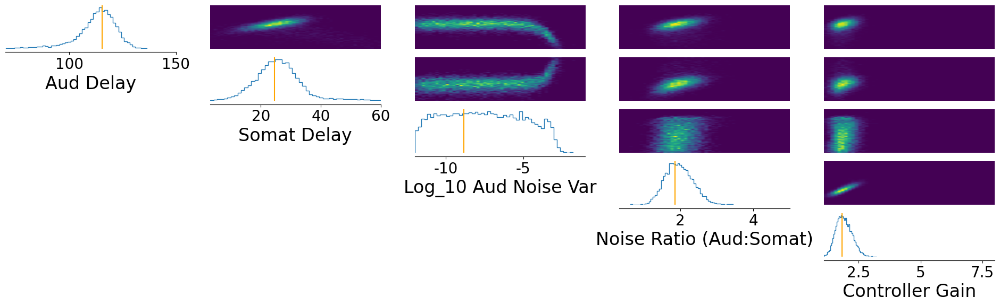

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([97.1226,  5.5745, -3.8900,  1.1522,  3.4094])


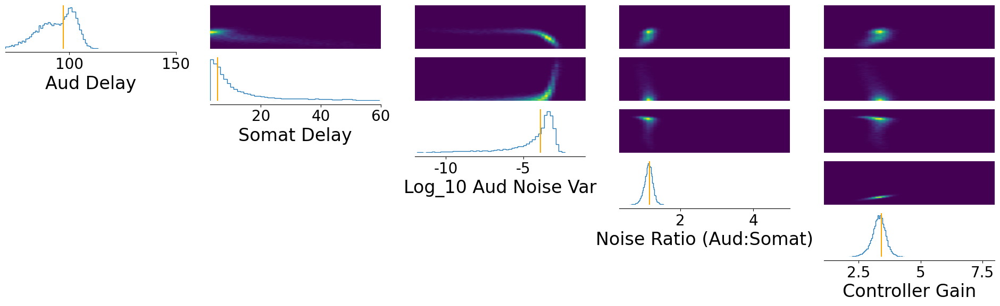

MSE: [0.47880081 5.02781647]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([113.6837,  24.9329,  -8.4677,   1.9869,   1.9726])


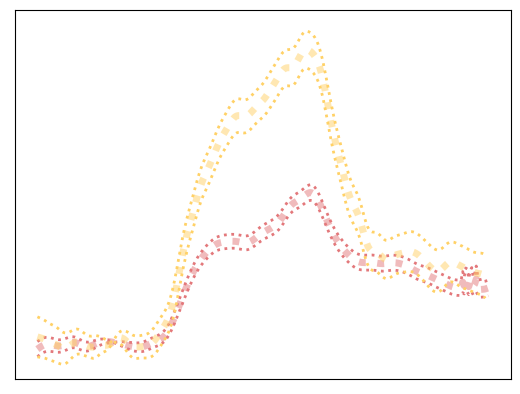

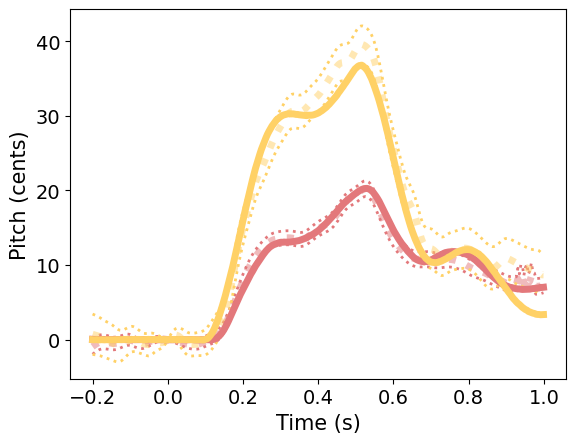

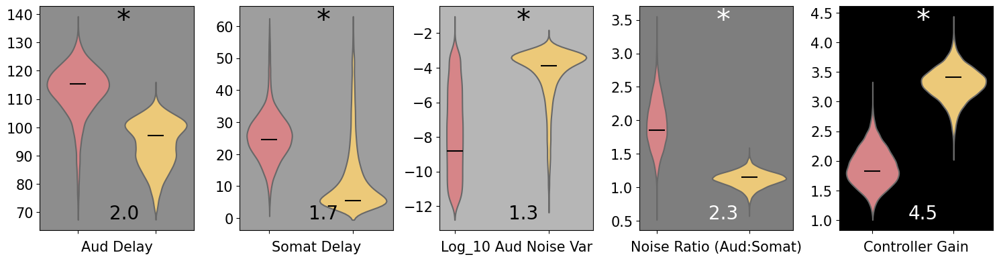

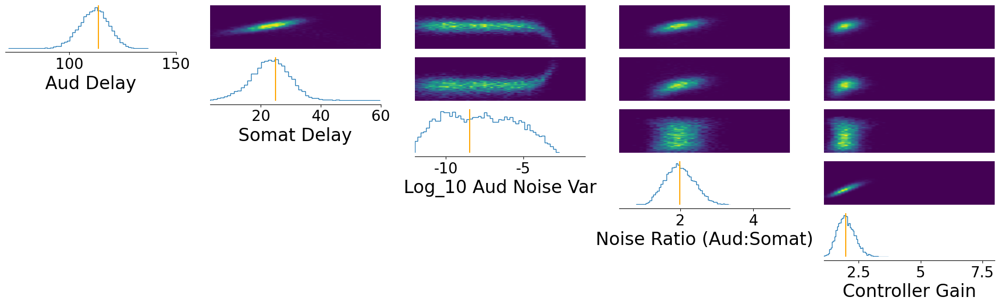

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([94.5312,  8.7949, -3.5402,  1.0289,  3.1697])


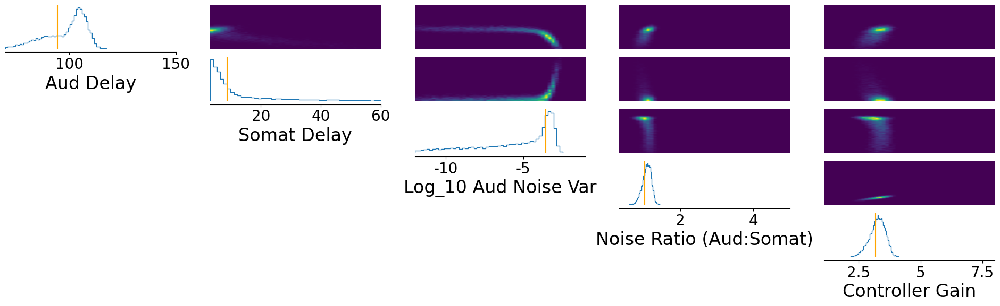

MSE: [0.3268483  2.88673117]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([114.3784,  24.5414,  -9.4319,   2.0305,   2.0566])


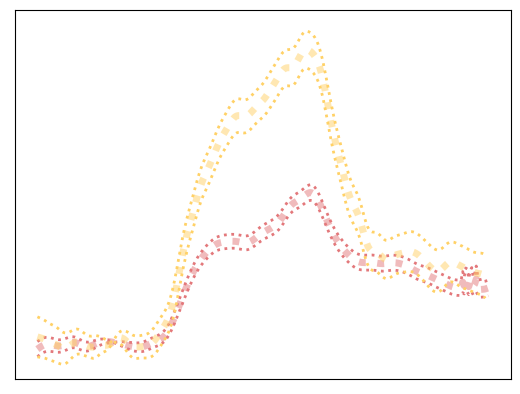

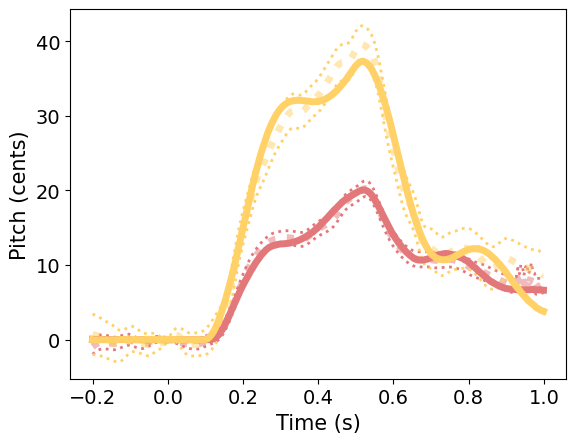

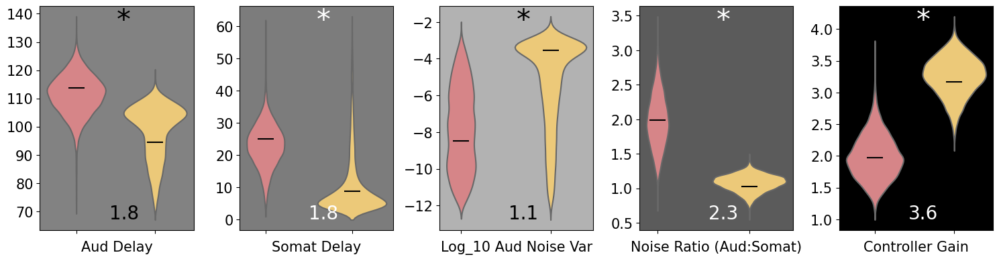

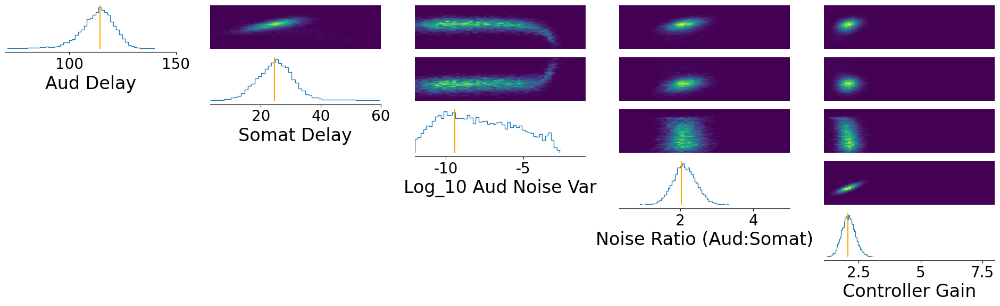

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([83.9110,  6.4720, -3.1861,  1.0124,  3.1771])


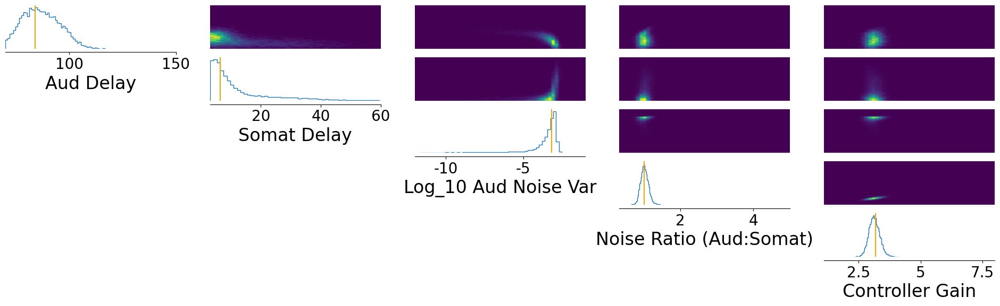

MSE: [0.43542404 2.5160785 ]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([111.0592,  29.3487,  -4.0720,   1.8748,   1.8705])


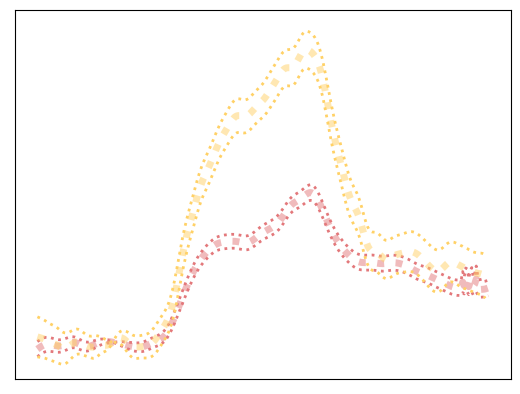

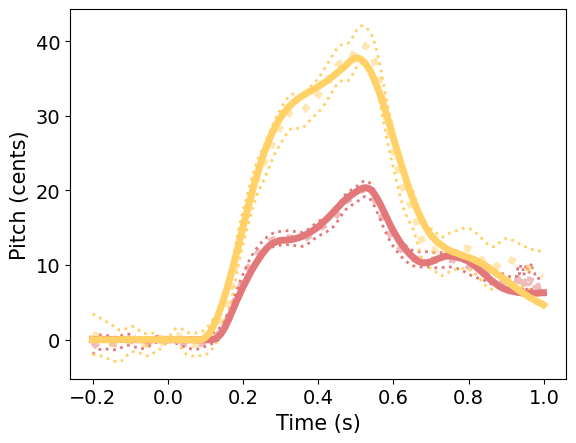

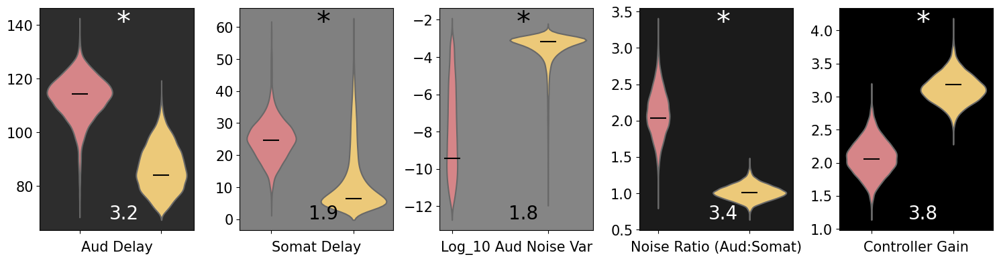

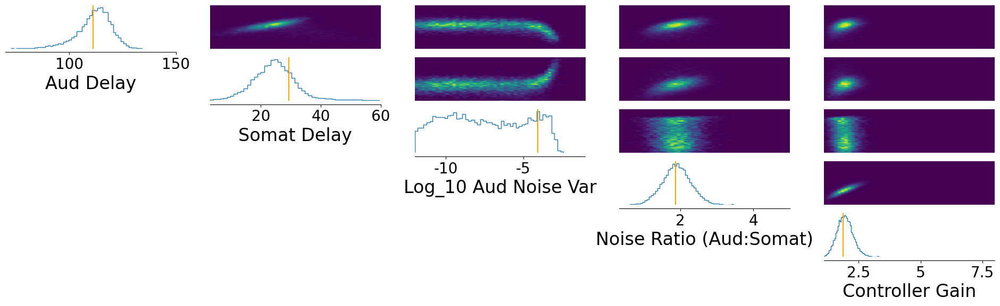

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([84.8522, 19.7897, -3.0311,  1.1160,  3.3022])


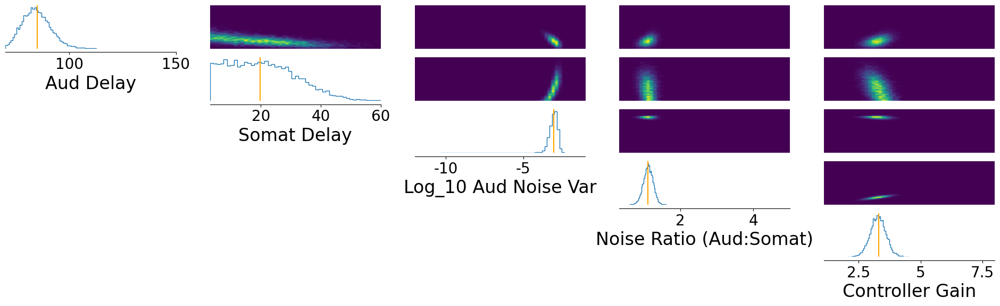

MSE: [0.52627192 3.38373995]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([113.2888,  24.7174,  -7.5635,   1.9579,   1.9722])


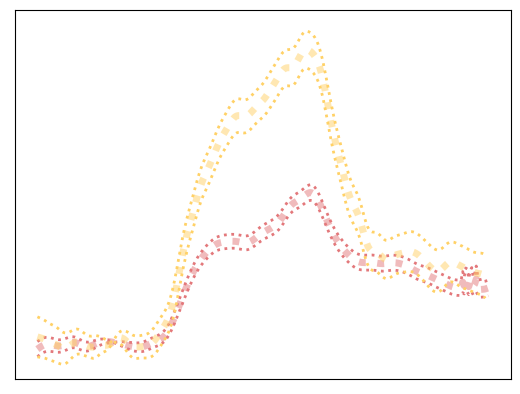

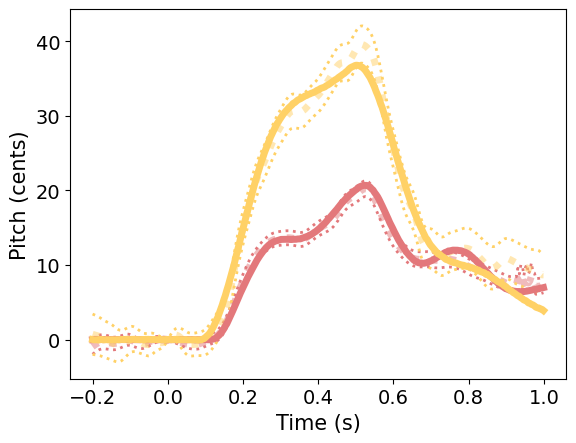

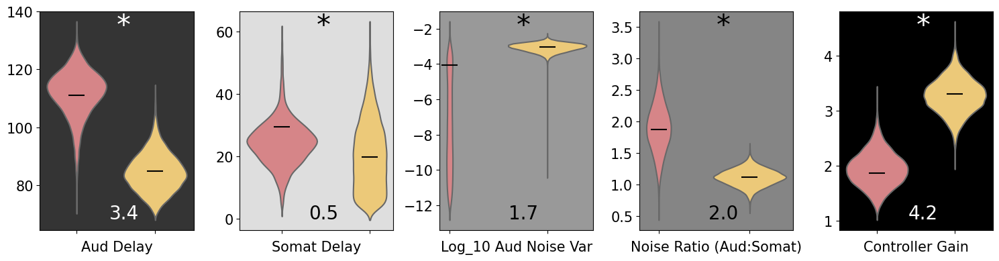

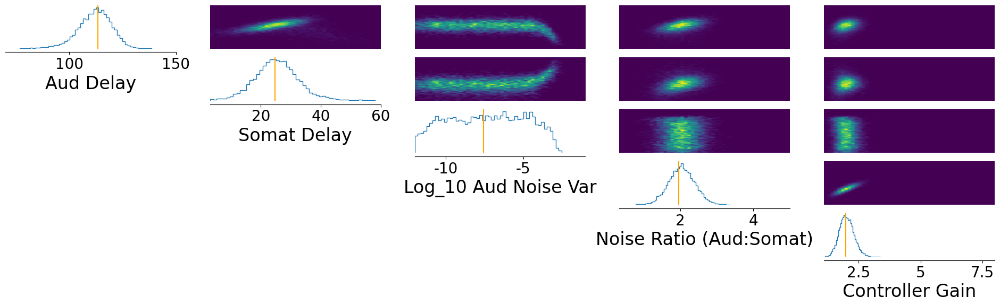

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([90.6285, 12.3420, -3.2789,  1.0985,  3.2034])


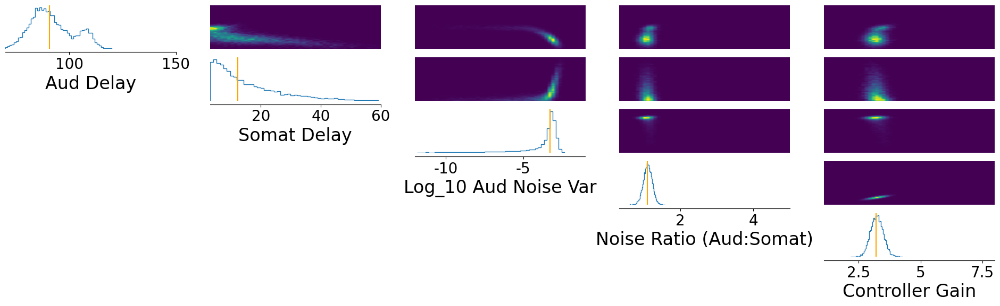

MSE: [0.34033464 2.80582103]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([116.4171,  24.4885,  -9.8265,   2.0717,   1.9895])


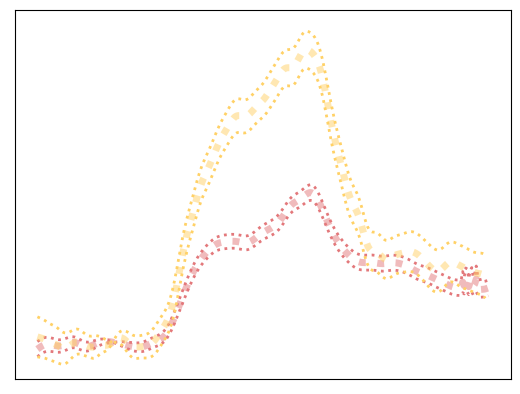

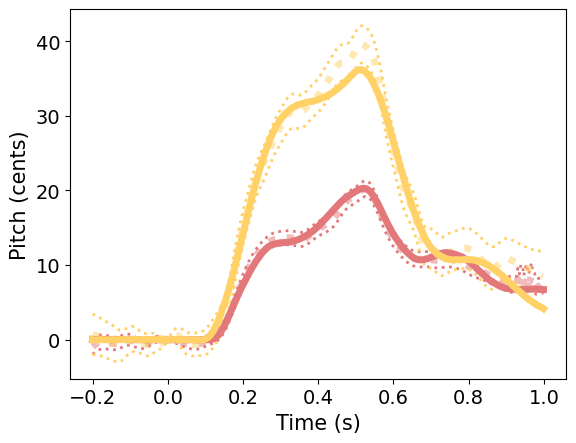

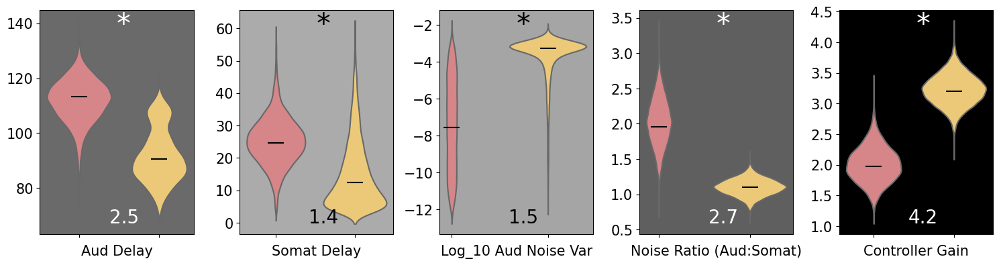

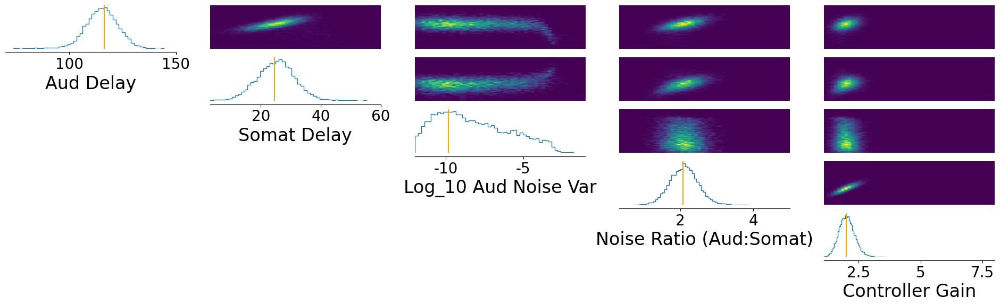

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([89.2322, 11.7672, -3.3018,  1.1113,  3.2191])


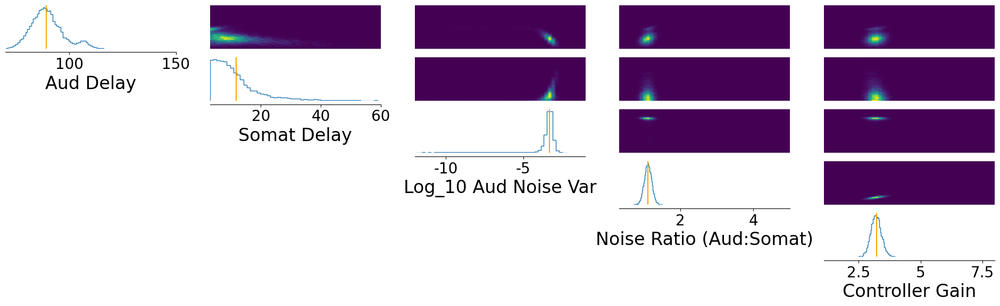

MSE: [0.45780068 3.13371946]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([114.3767,  24.4848,  -9.1647,   1.7306,   1.7669])


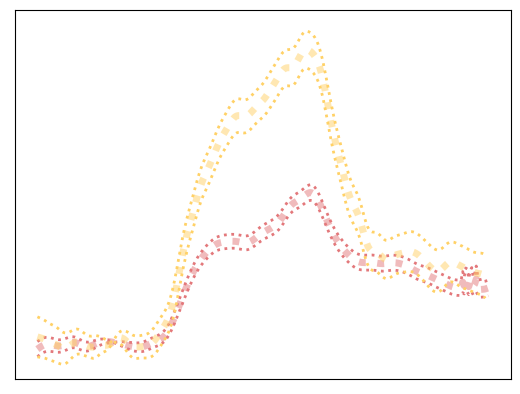

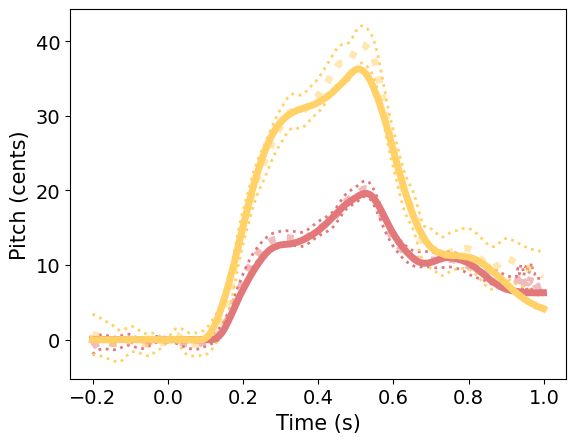

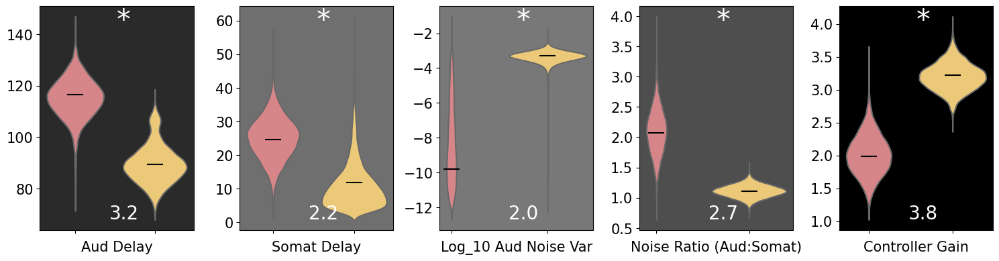

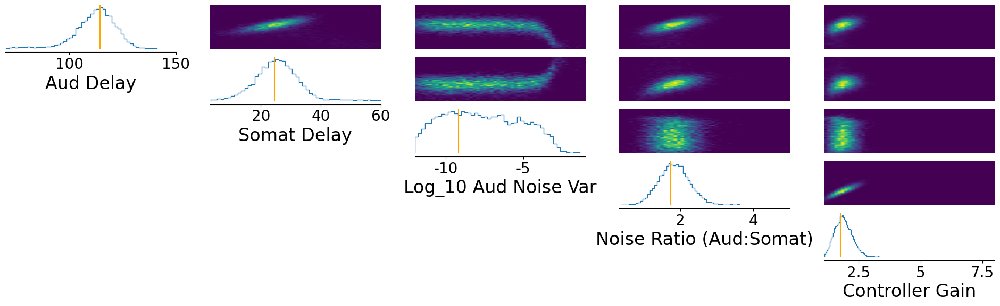

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([91.9487,  3.4482, -3.5409,  1.0089,  3.1248])


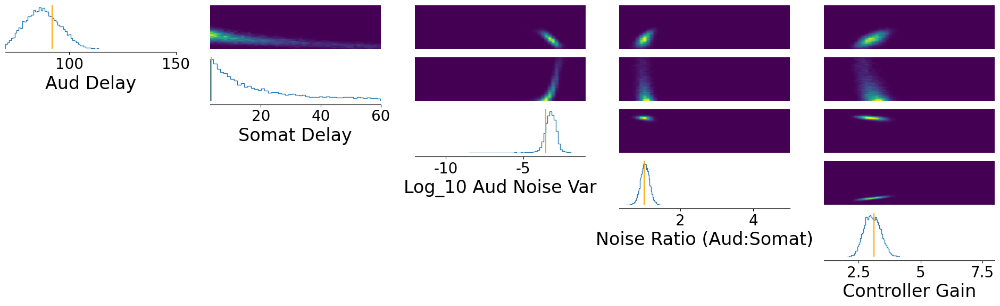

MSE: [0.71351543 2.32131713]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([111.4257,  20.4802,  -9.3522,   1.8788,   1.8497])


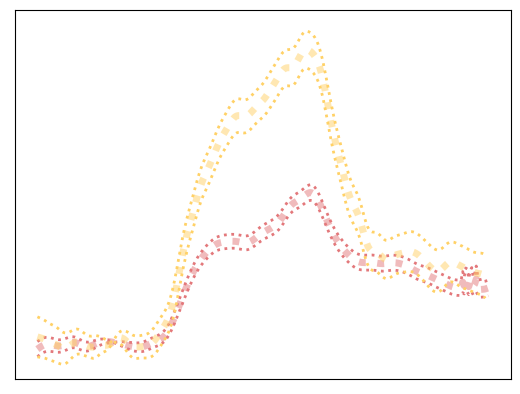

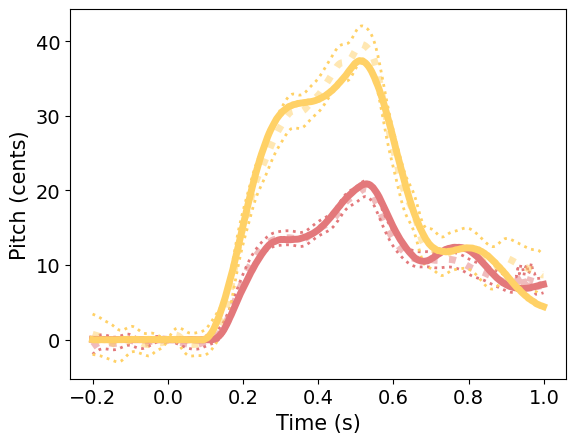

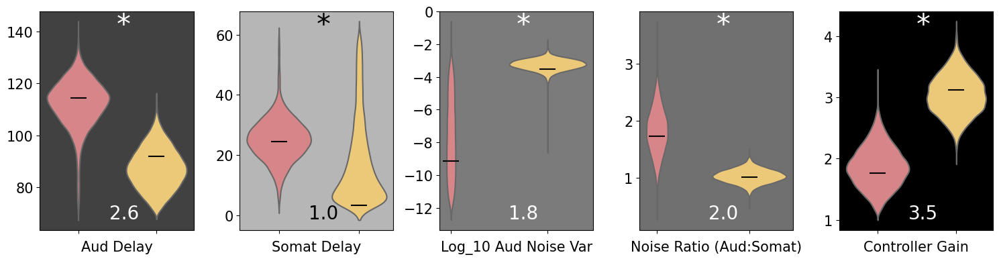

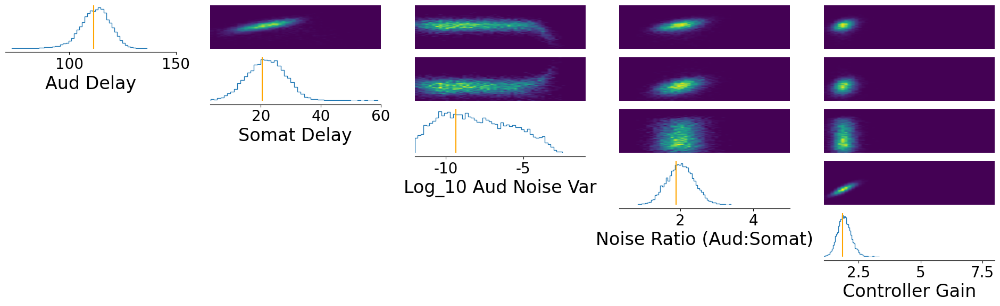

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([85.9761, 16.0023, -3.1598,  1.0704,  3.1428])


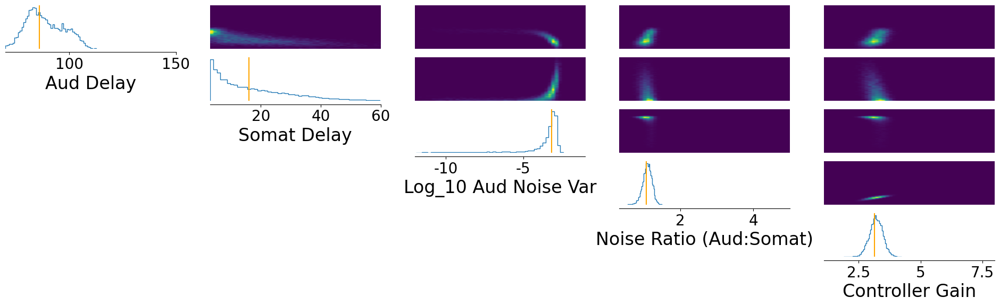

MSE: [0.42521665 2.67819811]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([114.2120,  25.6509,  -7.7980,   2.0894,   2.0506])


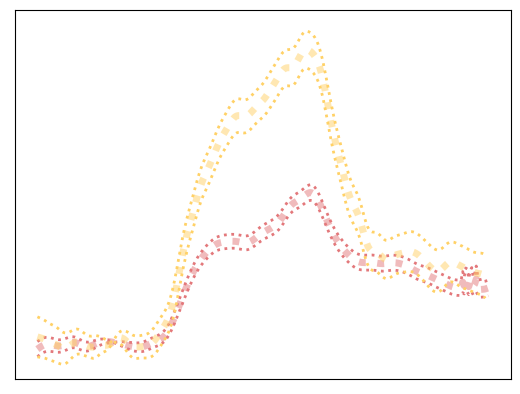

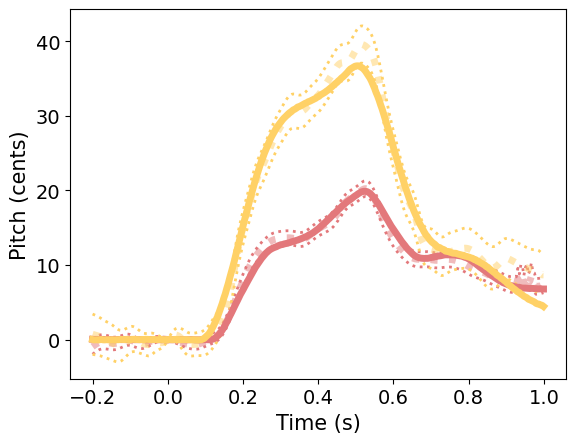

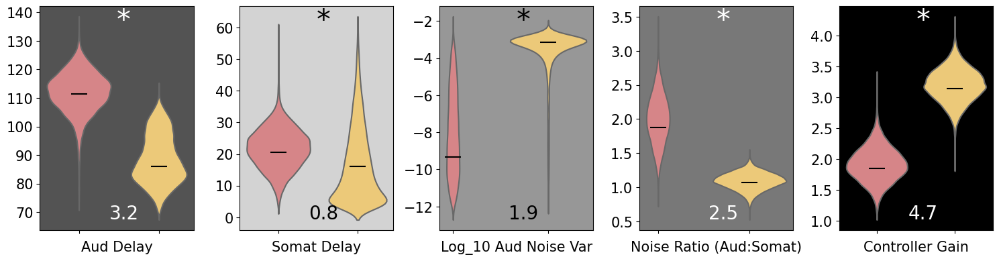

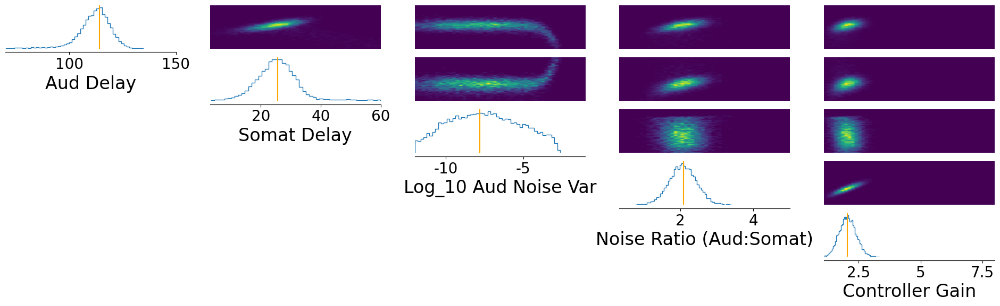

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([86.8139,  3.3837, -3.3219,  0.9751,  3.0804])


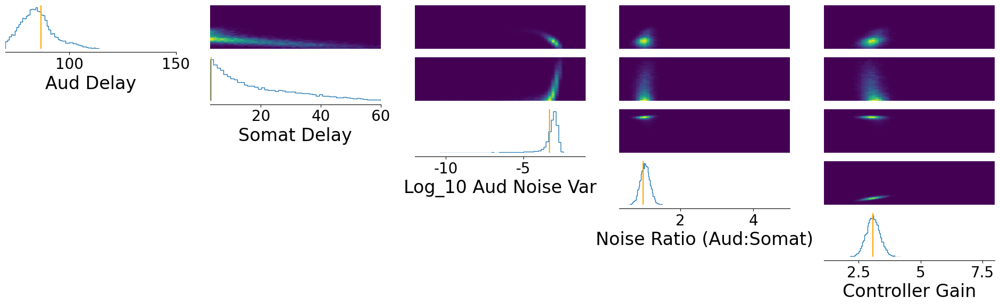

MSE: [0.43604205 2.16081649]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([112.7910,  23.5119,  -8.5708,   1.8472,   1.8193])


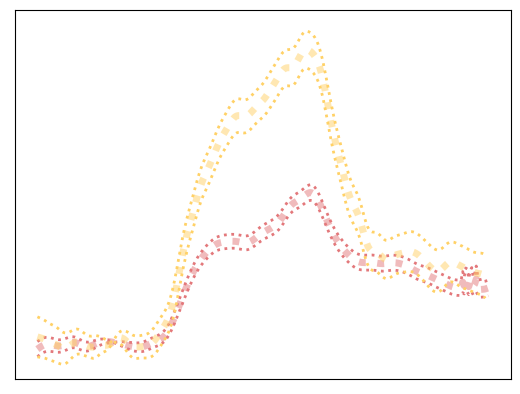

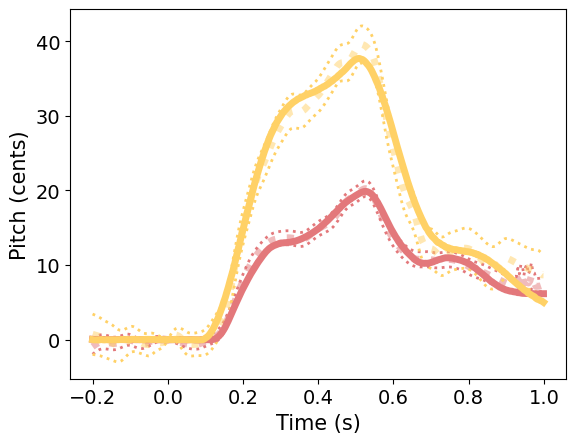

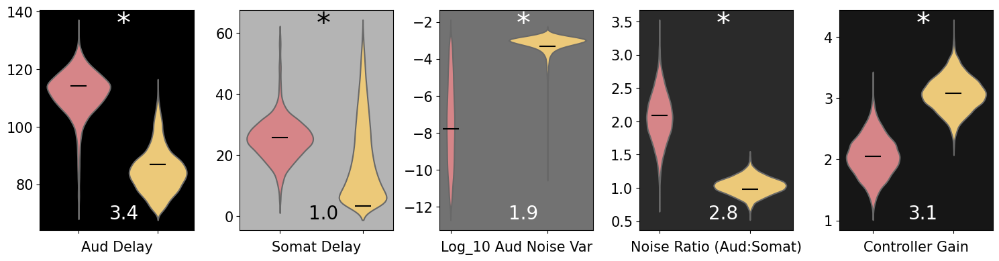

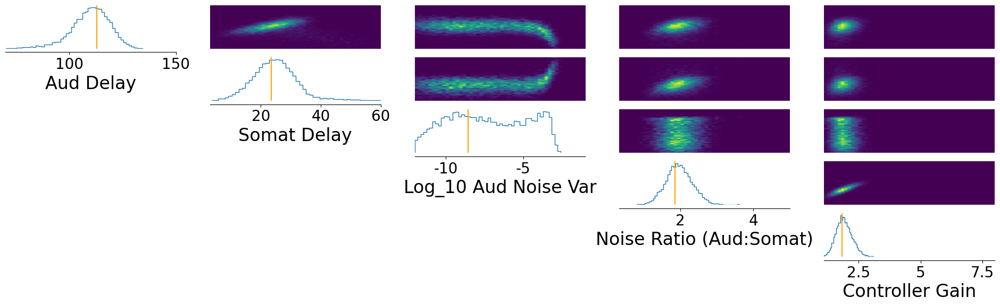

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([87.9352, 13.3531, -3.2976,  1.0471,  3.0810])


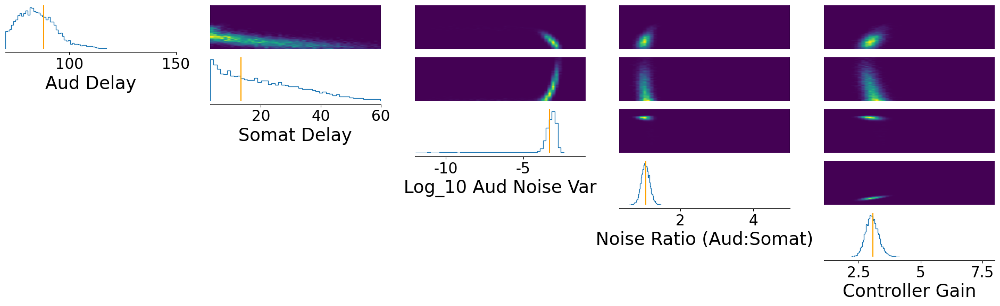

MSE: [0.36586145 2.39962348]
[[106.2701149  104.10746002  99.14469147  97.9556694  101.95866013
  102.82462692 103.16267395  98.70090485 100.51295471 100.36312103]
 [ 15.0781641   16.86390352  15.5067389   24.56918716  18.52972126
   18.12784815  13.96648288  18.24125195  14.51731968  18.43252087]
 [ -6.35524964  -6.00394261  -6.3089838   -3.55156195  -5.42122662
   -6.56416202  -6.35282576  -6.25601172  -5.55995286  -5.93421268]
 [  1.50088692   1.50789505   1.52145982   1.49537832   1.52820009
    1.59153104   1.36975986   1.47461498   1.53224772   1.44718283]
 [  2.61914659   2.5711422    2.61688435   2.58633494   2.58778906
    2.60429215   2.44588637   2.49625063   2.56548917   2.45011693]]


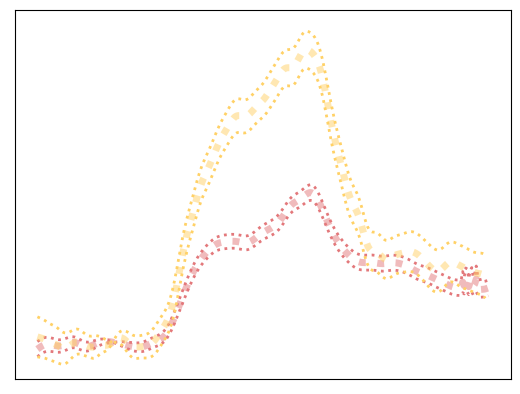

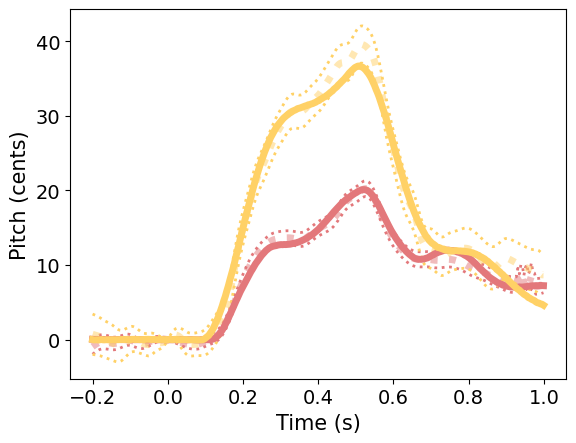

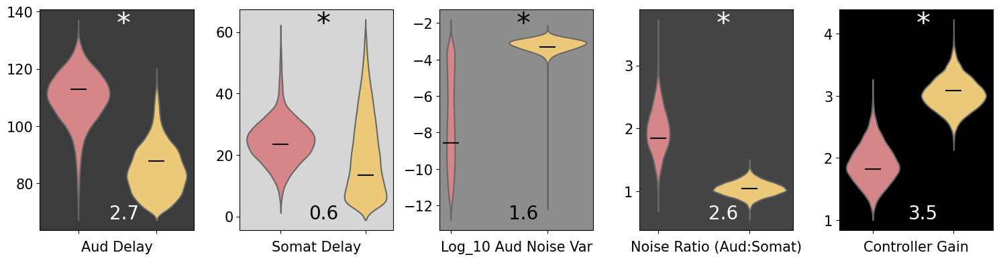

In [36]:
train = False
prior_min_all = [70, 3, -12, 0.3333, 1.1]
prior_max_all = [150, 60, -1, 5, 8]
data_list,inferred_control_values_all, mse_vals[0,:,:] = run_sbi('all_params',n_reps,prior_min_all,prior_max_all,all_labels,train=train)
inferred_control_values = np.median(inferred_control_values_all,axis=2)
print(inferred_control_values)

In [41]:
inferred_control_values = np.median(inferred_control_values_all,axis=2)
print(inferred_control_values)

[[113.94788361  88.58369827]
 [ 24.56164551  10.28105736]
 [ -8.69562149  -3.29972339]
 [  1.91835886   1.05878204]
 [  1.92133093   3.1733886 ]]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([116.1404,  23.7804, -10.5052,   2.3071,   2.3327])


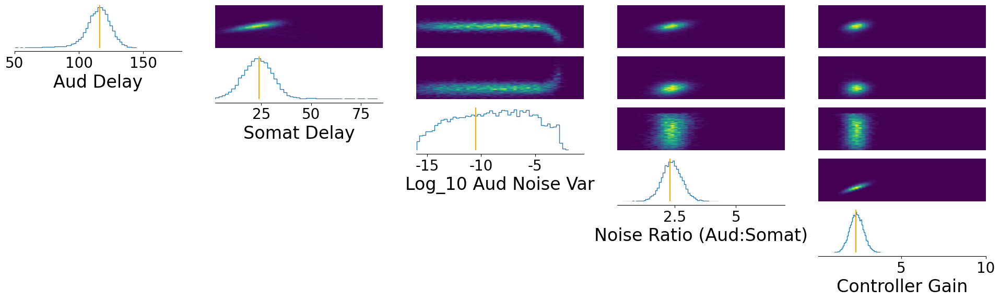

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([81.8931, 18.6741, -3.0320,  1.1596,  3.2817])


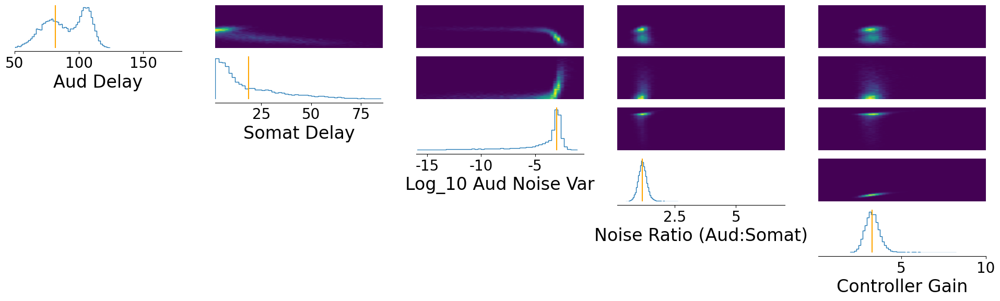

MSE: [0.74294513 4.11452722]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([112.4626,  21.4061, -12.8539,   2.0220,   1.9917])


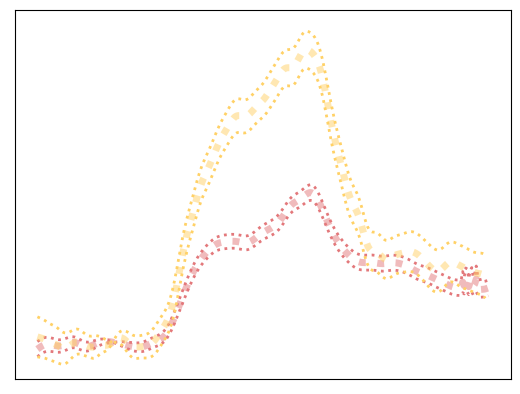

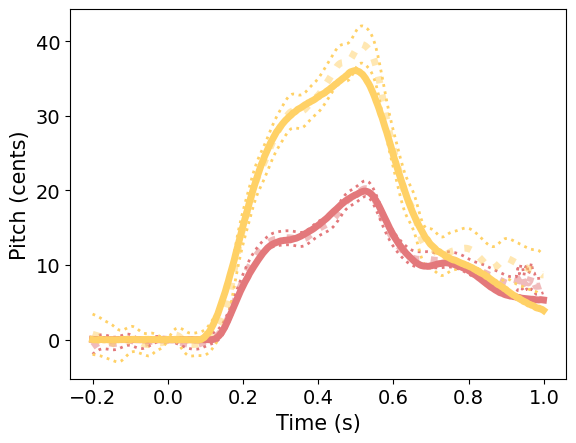

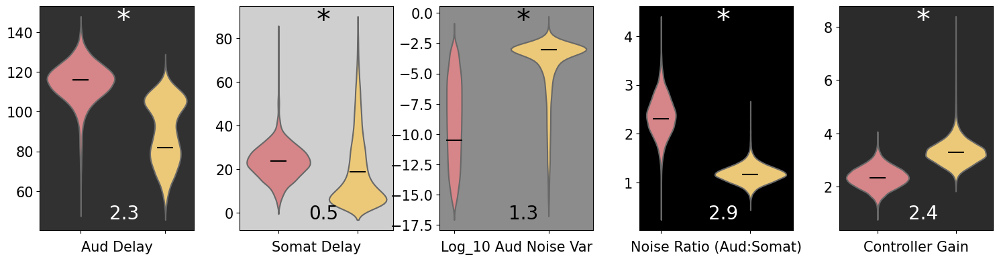

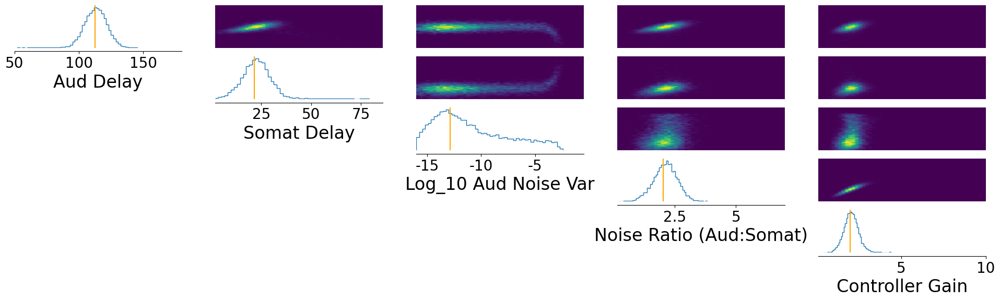

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([85.6469, 22.4076, -2.9887,  1.0890,  3.0958])


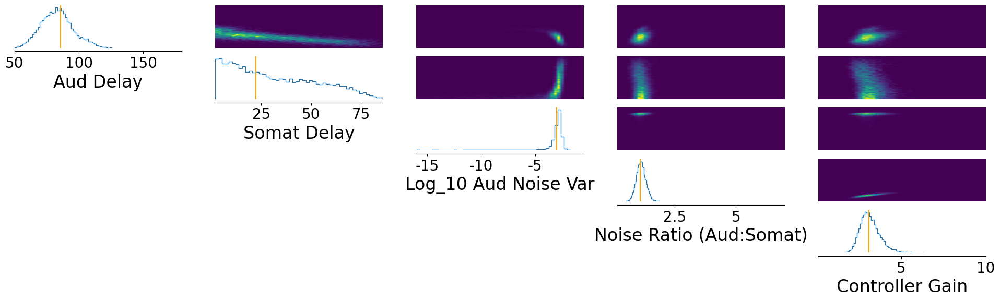

MSE: [0.41304155 2.79650534]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([116.8542,  21.2312, -12.7125,   2.3969,   2.3512])


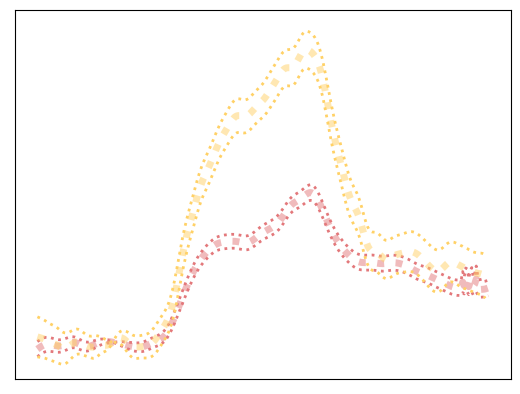

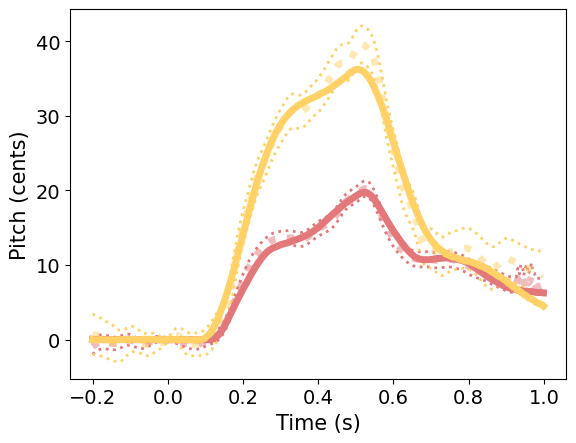

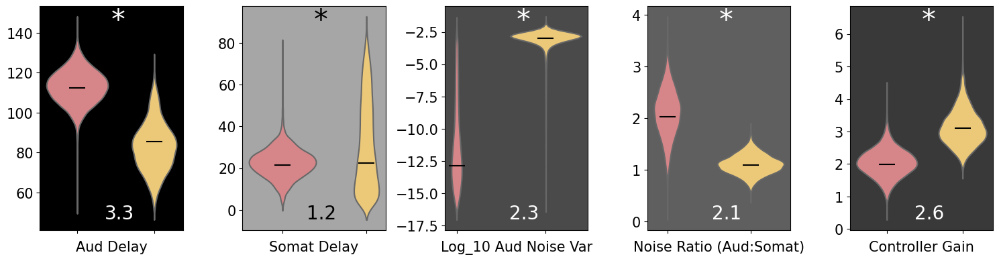

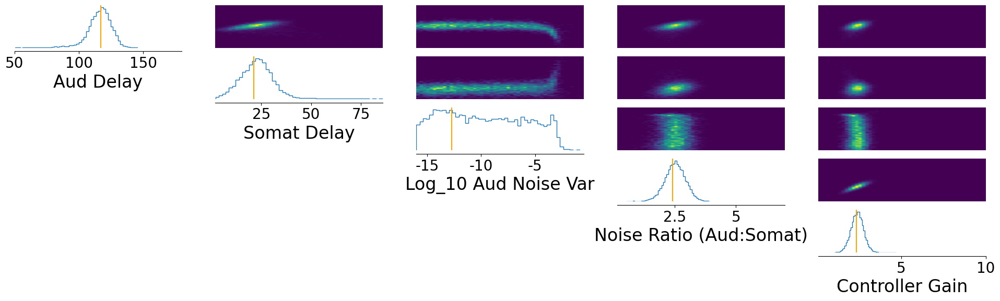

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([89.4524, 21.5108, -3.4242,  1.0683,  2.9724])


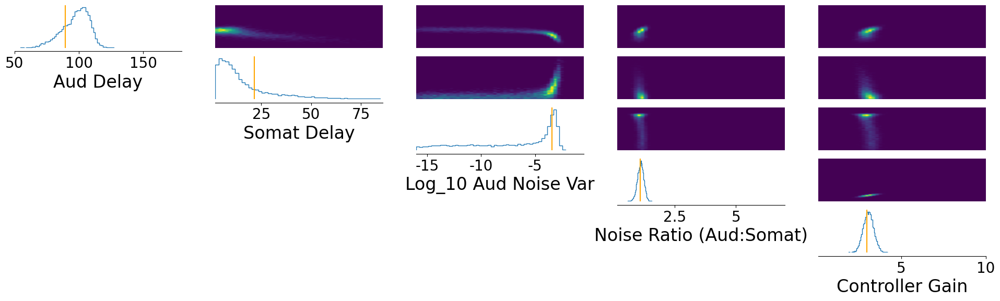

MSE: [1.01943055 4.64416061]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([114.7579,  23.5423, -13.1964,   1.8021,   1.9573])


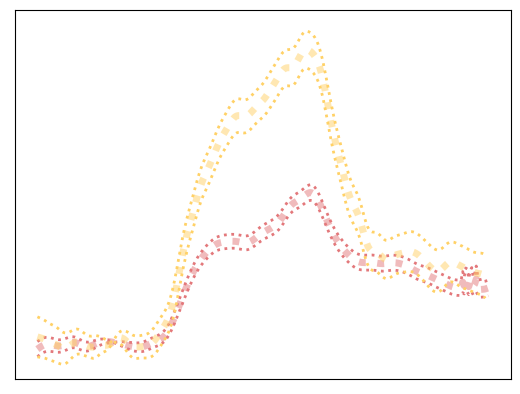

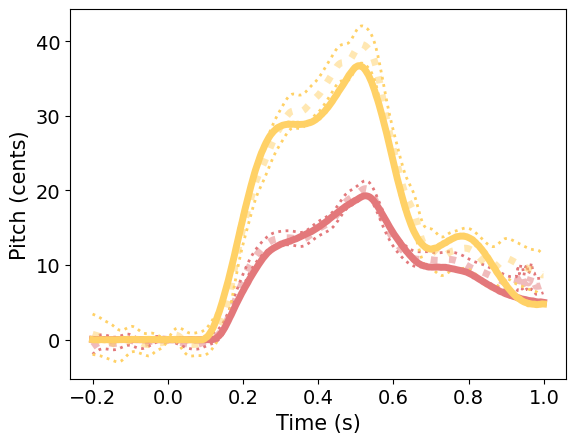

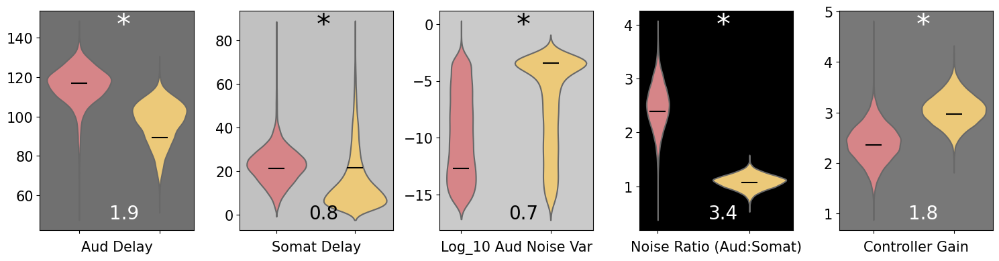

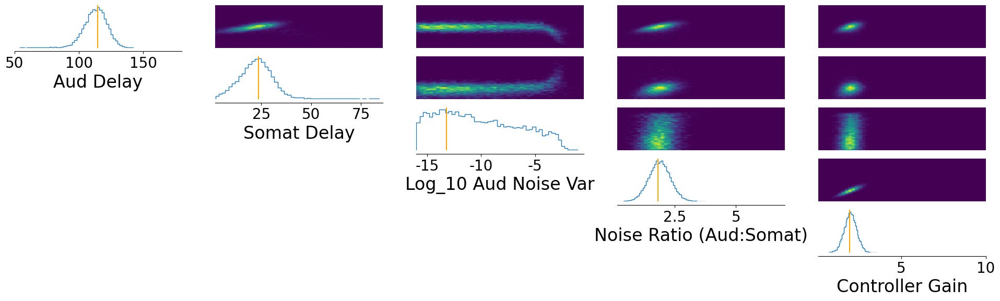

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([87.2207, 16.7649, -3.0056,  1.1601,  3.3306])


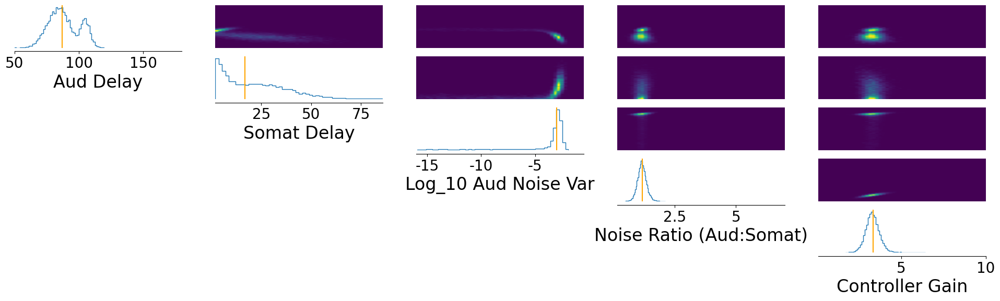

MSE: [0.97031802 3.86306469]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([112.2070,  21.3553, -11.5855,   1.8663,   1.9768])


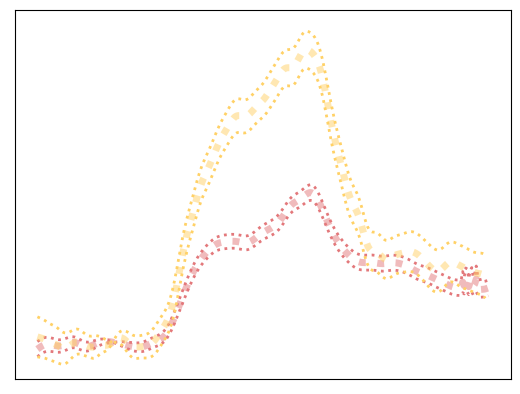

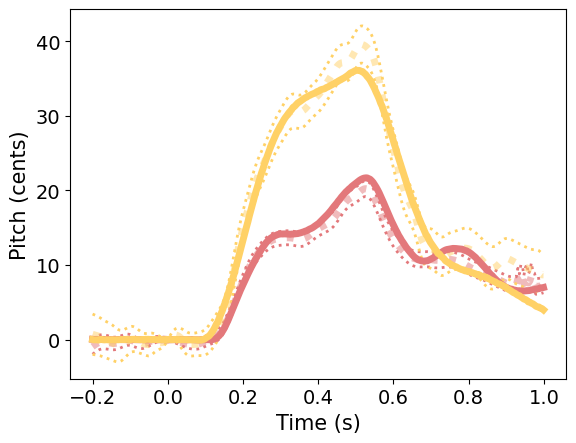

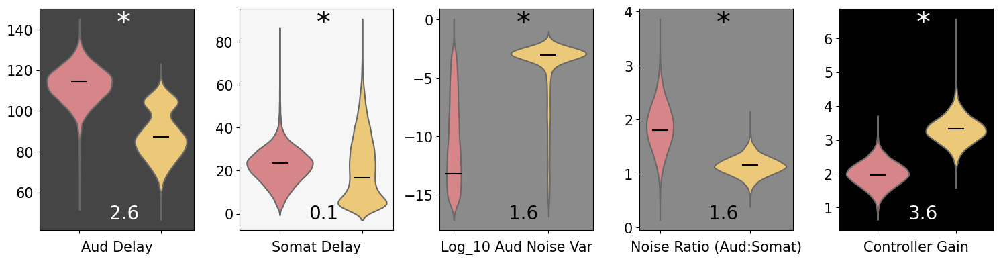

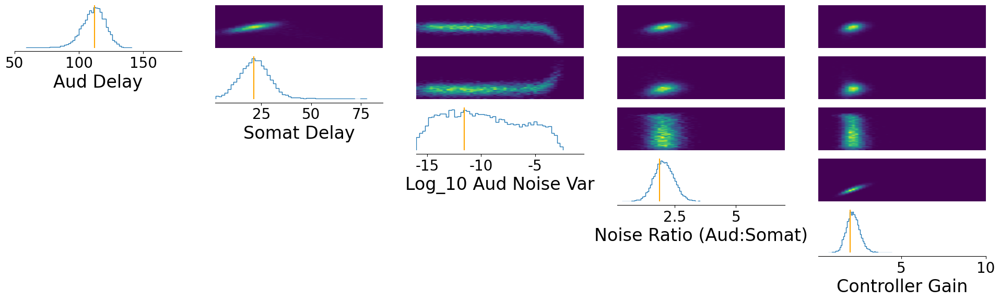

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([99.6866, 12.5750, -3.6983,  1.0463,  3.1292])


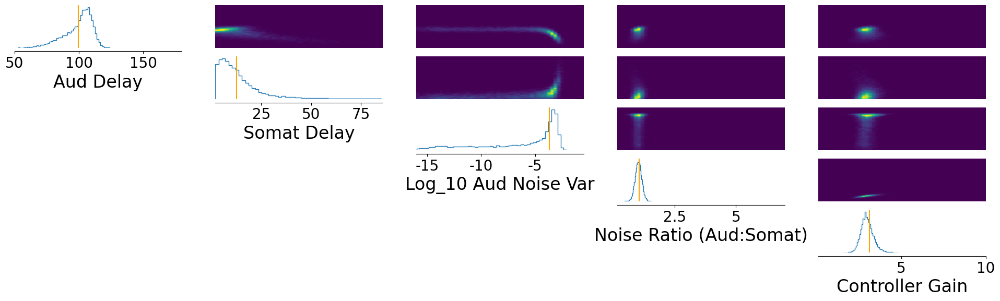

MSE: [0.59418751 4.93359822]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([112.9363,  23.2348, -11.0737,   2.1455,   2.1933])


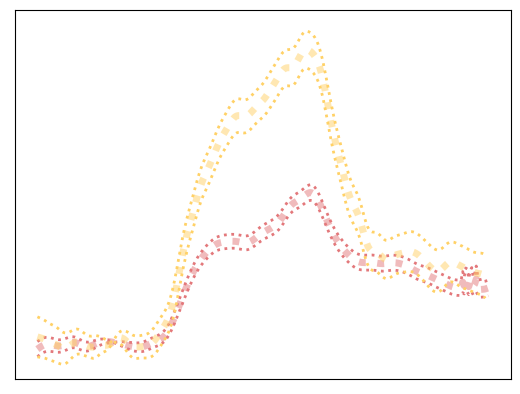

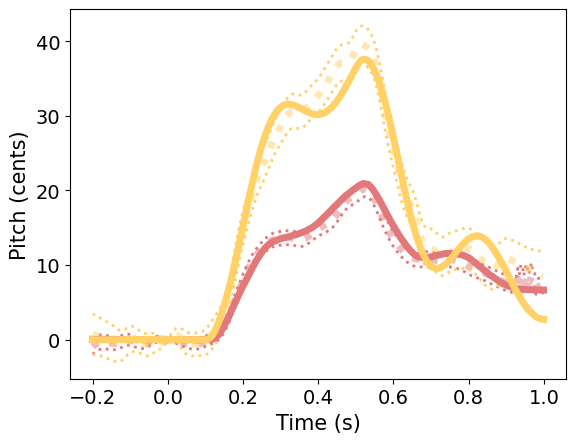

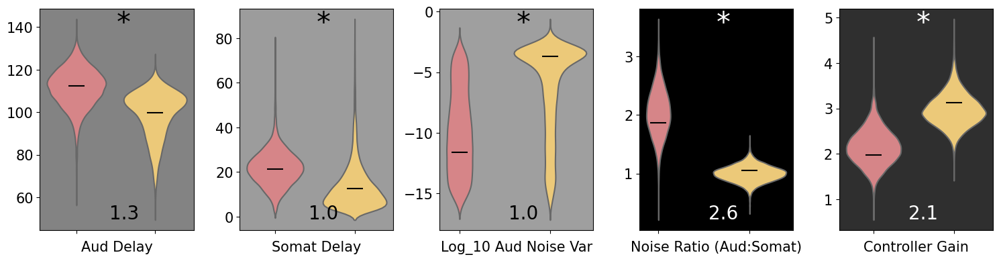

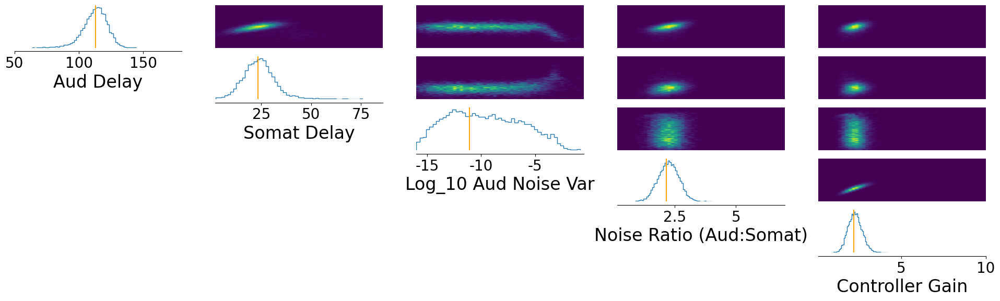

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([86.7988, 21.1146, -3.0826,  1.0239,  3.0113])


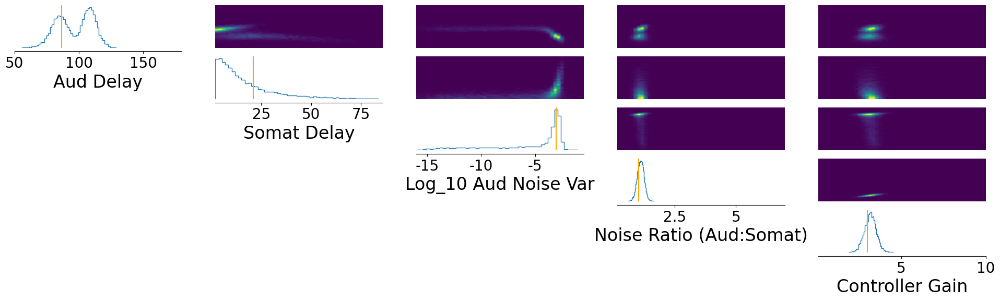

MSE: [0.48861968 2.29698999]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([111.9100,  24.1506,  -8.0292,   1.8962,   1.9532])


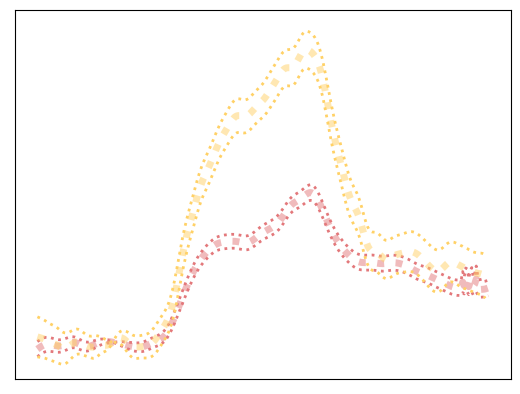

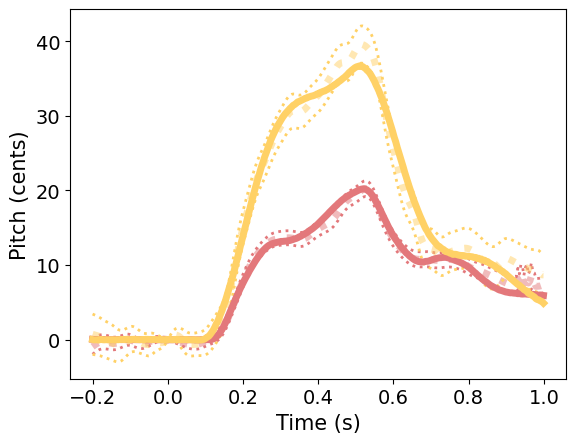

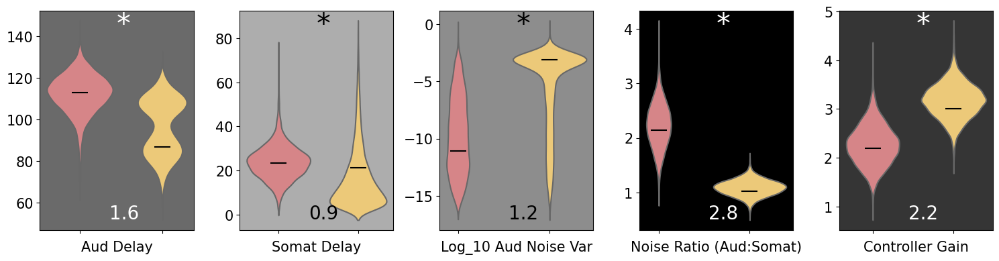

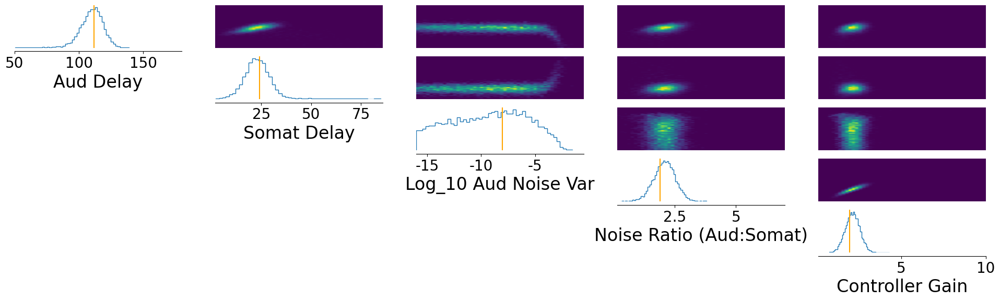

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([101.1478,   8.7210,  -3.8474,   1.0840,   3.2549])


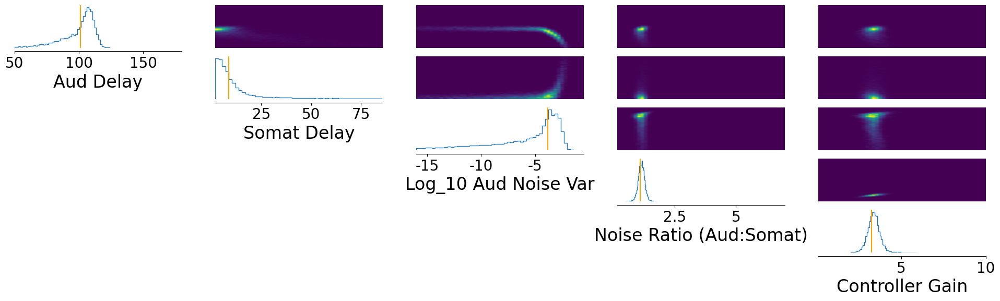

MSE: [0.41597302 5.02488654]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([116.1876,  27.4171,  -9.4000,   2.1770,   2.1670])


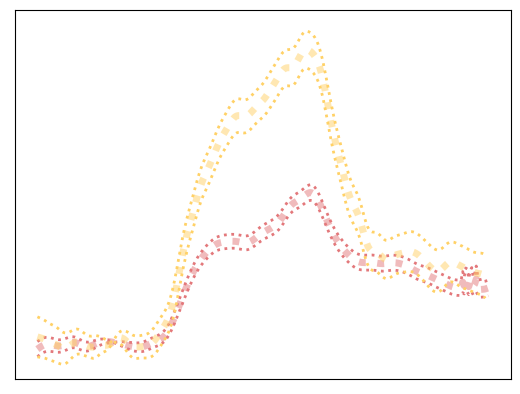

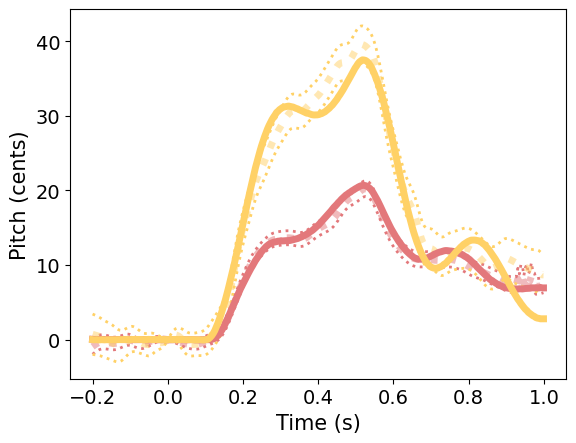

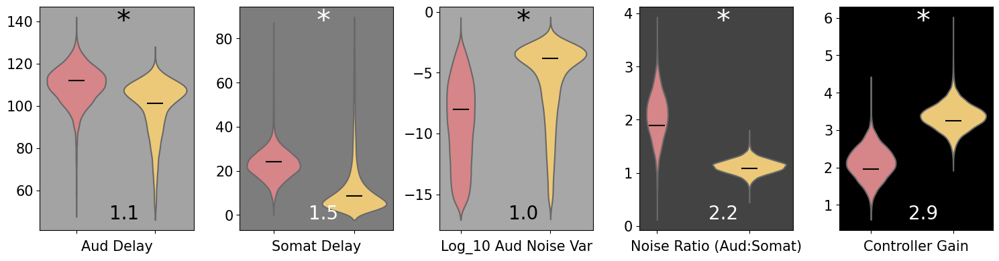

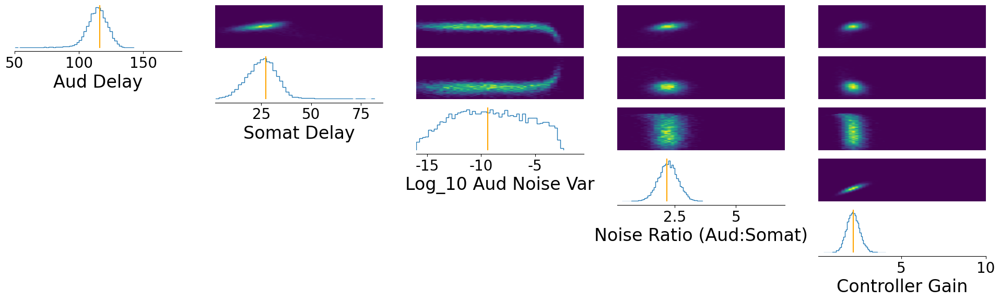

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([97.9242,  6.8349, -3.5615,  1.2260,  3.4253])


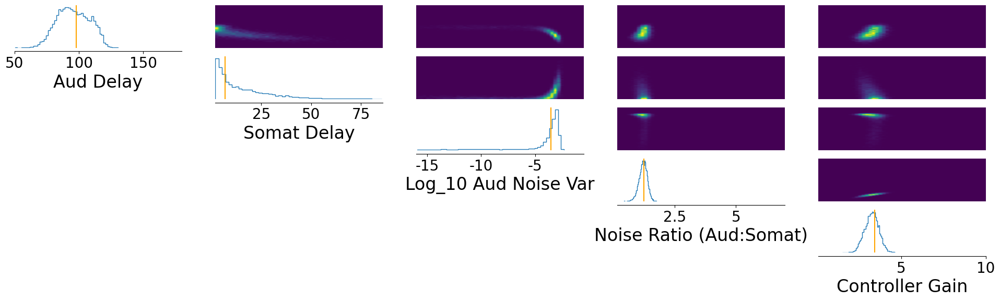

MSE: [0.51002754 5.31386779]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([115.2223,  25.3454,  -8.8259,   2.1059,   2.1006])


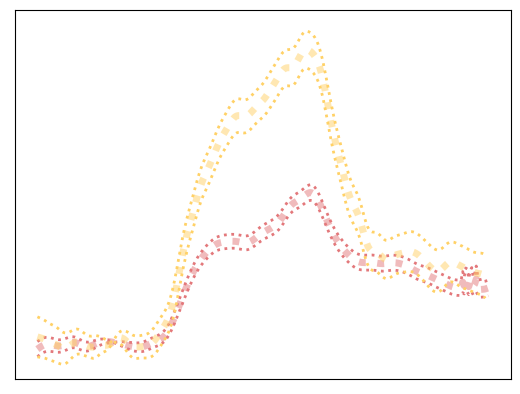

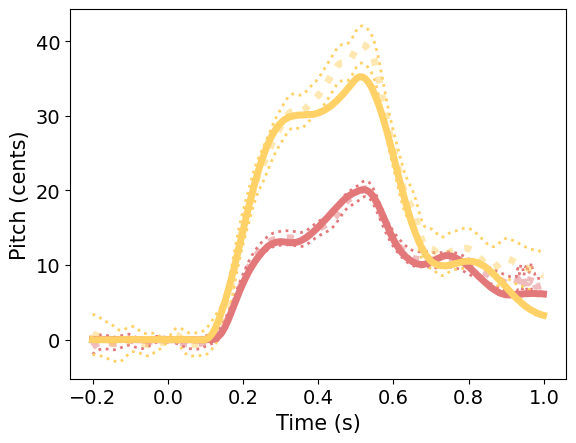

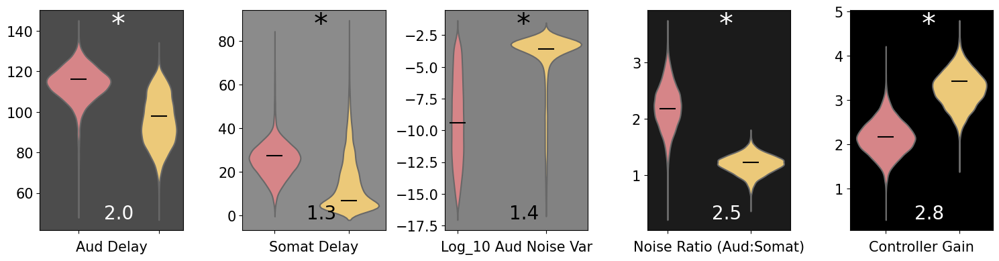

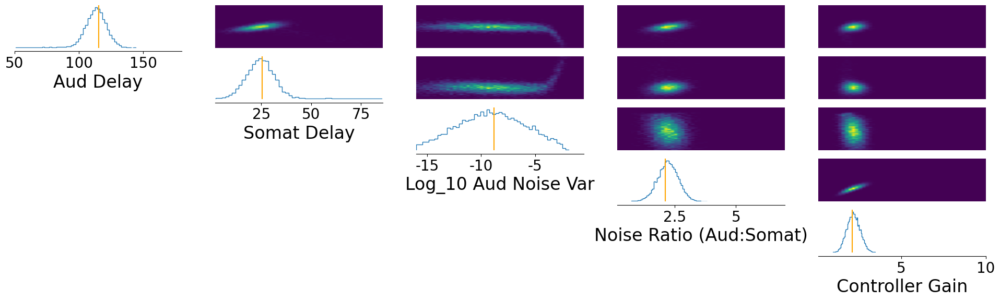

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([105.2058,   2.0859,  -5.0429,   1.1753,   3.4319])


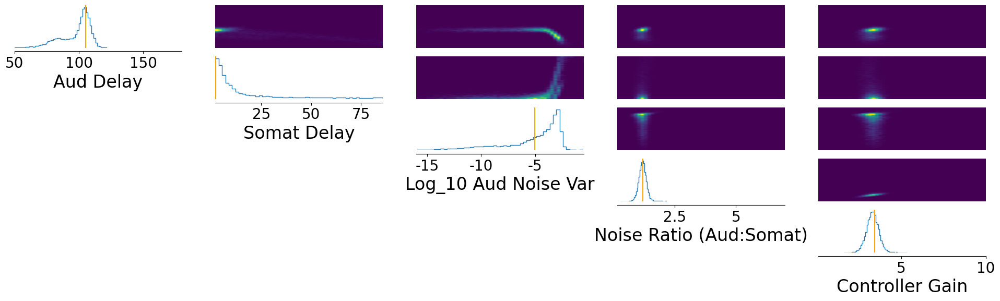

MSE: [0.44838521 8.08928563]


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([110.5910,  22.4796,  -5.4996,   1.8864,   1.9142])


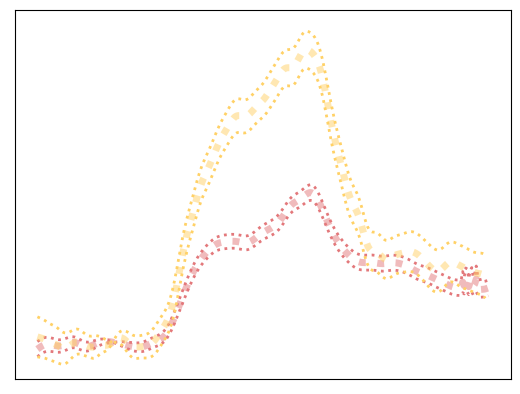

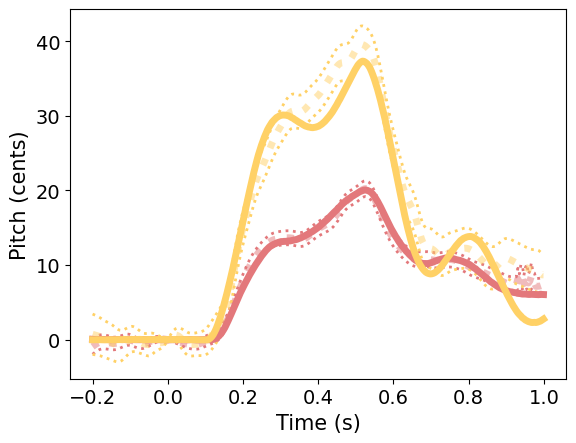

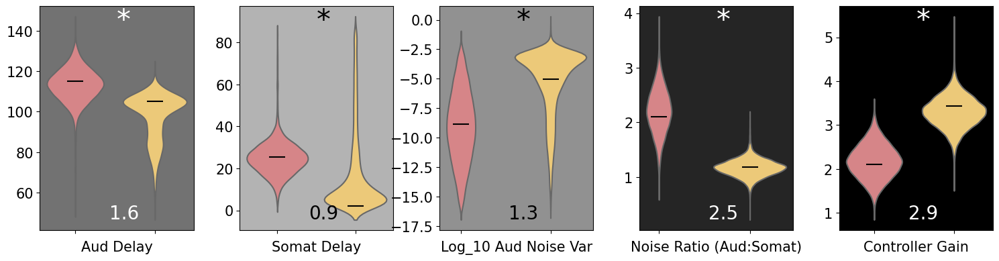

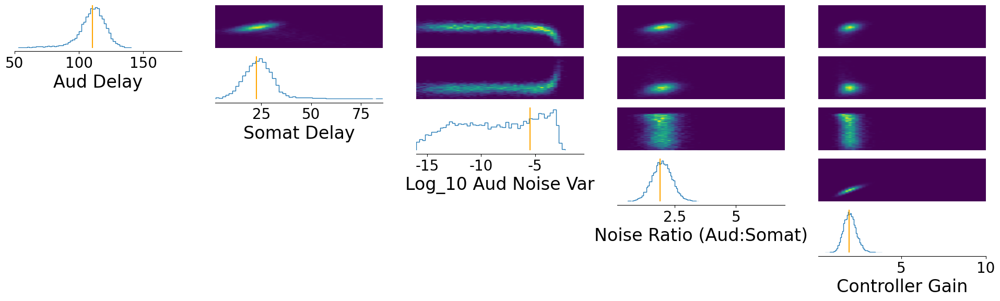

Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

tensor([86.4925, 23.9508, -3.0715,  1.0579,  3.0750])


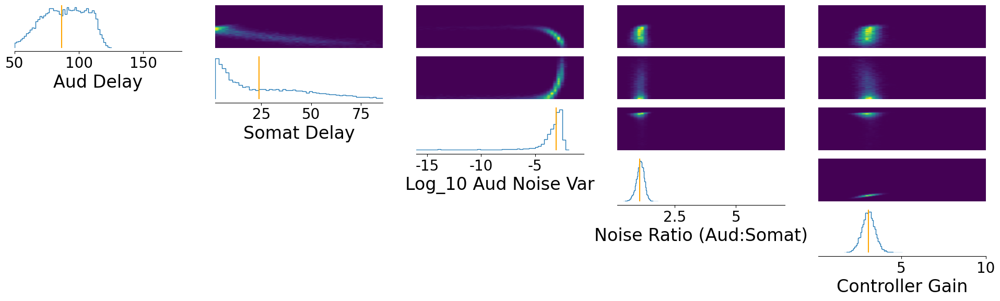

MSE: [0.37796305 2.49010819]
[[ 99.01673889  99.05477142 103.15329361 100.98925781 105.94683456
   99.86754227 106.52893066 107.05589676 110.21403885  98.54175186]
 [ 21.22729588  21.90685558  21.37102222  20.15356541  16.96517515
   22.17471886  16.43578911  17.12599397  13.7156328   23.21520233]
 [ -6.76859868  -7.92130995  -8.06835413  -8.10098553  -7.64192653
   -7.07813835  -5.93825734  -6.48072827  -6.93441606  -4.28554976]
 [  1.73333931   1.55550063   1.73261315   1.48112291   1.45632911
    1.58470374   1.49009621   1.70150965   1.64063001   1.47213918]
 [  2.80723727   2.54373842   2.66181135   2.64395809   2.55297422
    2.60231328   2.60406071   2.79612076   2.76627433   2.49457431]]


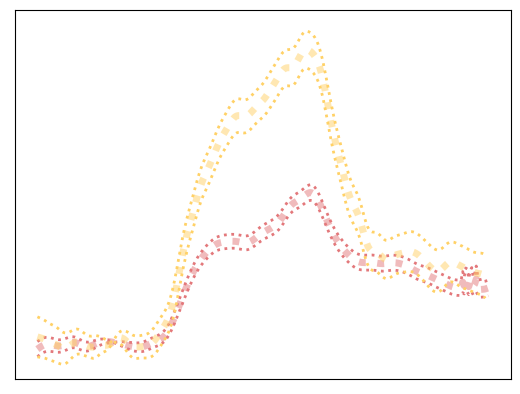

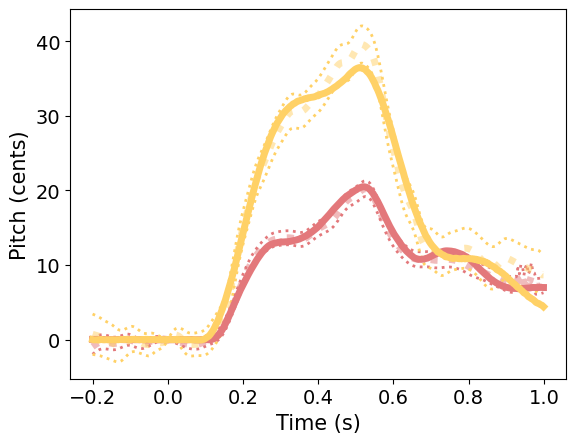

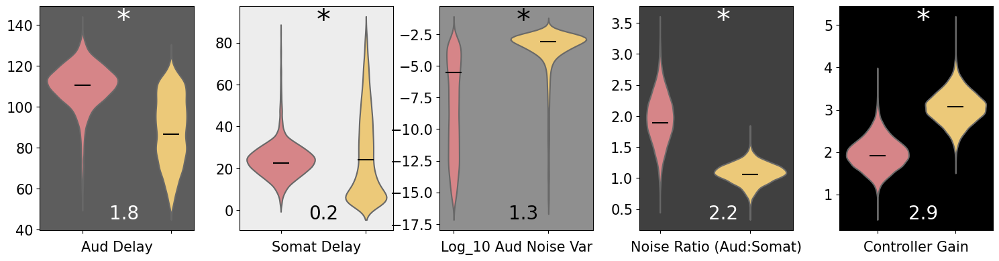

In [37]:
# 50% wider prior
train = False
prior_min_all = [50, 2, -16, 0.14, 0.1]
prior_max_all = [180, 86, -0.5, 7, 10]
data_list1,inferred_control_values_all1, mse_vals[1,:,:] = run_sbi('all_params_50wider',n_reps,prior_min_all,prior_max_all,all_labels,train=train)
inferred_control_values1 = np.median(inferred_control_values_all1,axis=2)
print(inferred_control_values1)